Install and libraries needed

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import os

os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=0"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

import tensorflow as tf
from tensorflow import keras

tf.config.optimizer.set_jit(False)

print("TensorFlow version:", tf.__version__)
print("XLA/JIT setting:", tf.config.optimizer.get_jit())

TensorFlow version: 2.20.0
XLA/JIT setting: 


In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import joblib

import matplotlib.pyplot as plt
from PIL import Image

AUTOTUNE = tf.data.AUTOTUNE

Settings

In [ ]:
RGB_IMG_HEIGHT = 224
RGB_IMG_WIDTH  = 224
BATCH_SIZE = 16
SEED = 42

tf.random.set_seed(SEED)
np.random.seed(SEED)

OWN_DATASET_DIR = Path("/content/drive/MyDrive/Speciale/Own test data set")

MODEL3_PRED_CSV = OWN_DATASET_DIR / "model_3_v3_dinov2_own_test_predictions.csv"

MODEL20_DIR = Path(
    "/content/drive/MyDrive/Speciale/Models/Model_20_DINOv2_base_ingredient_classifier"
)

MODEL22_DIR = Path(
    "/content/drive/MyDrive/Speciale/Models/Model_22_Carbohydrate_estimator_plus_ingredient_estimator"
)

MODEL20_FINAL_MODEL = MODEL20_DIR / "final_model.keras"

MODEL22_MODEL_PATH = MODEL22_DIR / "model22_neural_combiner.keras"
MODEL22_WEIGHTS_PATH = MODEL22_DIR / "best_model22_neural_combiner.weights.h5"
RGB_SCALER_PATH = MODEL22_DIR / "rgb_scaler.joblib"

MODEL22_OUTPUT_CSV = OWN_DATASET_DIR / "model_22_own_test_predictions.csv"
MODEL22_CLEAN_OUTPUT_CSV = OWN_DATASET_DIR / "model_22_own_test_predictions_clean.csv"

print("Own dataset folder:", OWN_DATASET_DIR)
print("Model 3 V3 prediction CSV:", MODEL3_PRED_CSV)
print("Model 20 folder:", MODEL20_DIR)
print("Model 22 folder:", MODEL22_DIR)
print("Model 22 output CSV:", MODEL22_OUTPUT_CSV)

Own dataset folder: /content/drive/MyDrive/Speciale/Own test data set
Model 3 V3 prediction CSV: /content/drive/MyDrive/Speciale/Own test data set/model_3_v3_dinov2_own_test_predictions.csv
Model 20 folder: /content/drive/MyDrive/Speciale/Models/Model_20_DINOv2_base_ingredient_classifier
Model 22 folder: /content/drive/MyDrive/Speciale/Models/Model_22_Carbohydrate_estimator_plus_ingredient_estimator
Model 22 output CSV: /content/drive/MyDrive/Speciale/Own test data set/model_22_own_test_predictions.csv


In [ ]:
paths_to_check = {
    "Own dataset folder": OWN_DATASET_DIR,
    "Model 3 V3 predictions CSV": MODEL3_PRED_CSV,
    "Model 20 final model": MODEL20_FINAL_MODEL,
    "Model 22 full model": MODEL22_MODEL_PATH,
    "Model 22 weights": MODEL22_WEIGHTS_PATH,
    "RGB scaler": RGB_SCALER_PATH,
}

for name, path in paths_to_check.items():
    print(f"{name}: {path}")
    print("Exists:", path.exists())
    print()

Own dataset folder: /content/drive/MyDrive/Speciale/Own test data set
Exists: True

Model 3 V3 predictions CSV: /content/drive/MyDrive/Speciale/Own test data set/model_3_v3_dinov2_own_test_predictions.csv
Exists: True

Model 20 final model: /content/drive/MyDrive/Speciale/Models/Model_20_DINOv2_base_ingredient_classifier/final_model.keras
Exists: True

Model 22 full model: /content/drive/MyDrive/Speciale/Models/Model_22_Carbohydrate_estimator_plus_ingredient_estimator/model22_neural_combiner.keras
Exists: True

Model 22 weights: /content/drive/MyDrive/Speciale/Models/Model_22_Carbohydrate_estimator_plus_ingredient_estimator/best_model22_neural_combiner.weights.h5
Exists: True

RGB scaler: /content/drive/MyDrive/Speciale/Models/Model_22_Carbohydrate_estimator_plus_ingredient_estimator/rgb_scaler.joblib
Exists: True



Loading model 3 V3 prediction CSV

In [ ]:
own_test_df = pd.read_csv(MODEL3_PRED_CSV)

required_cols = ["dish_id", "rgb_path", "image_name", "predicted_carb_g"]
missing_cols = [c for c in required_cols if c not in own_test_df.columns]

if len(missing_cols) > 0:
    raise ValueError(f"Missing columns in Model 3 V3 prediction CSV: {missing_cols}")

own_test_df["rgb_path"] = own_test_df["rgb_path"].astype(str)

print("Loaded own test dataset with Model 3 V3 predictions")
print("Shape:", own_test_df.shape)

display(own_test_df.head())

Loaded own test dataset with Model 3 V3 predictions
Shape: (62, 4)


,dish_id,rgb_path,image_name,predicted_carb_g
0,Dish_0001,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0130.jpeg,50.170930
1,Dish_0002,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0139.jpeg,36.032814
2,Dish_0003,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0148.jpg,3.953832
3,Dish_0004,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0158.jpg,18.204813
4,Dish_0005,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0192.jpg,36.296500


Image loading

In [ ]:
def load_rgb_image(rgb_path):
    image = tf.io.read_file(rgb_path)
    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize_with_pad(
        image,
        target_height=RGB_IMG_HEIGHT,
        target_width=RGB_IMG_WIDTH,
        method=tf.image.ResizeMethod.BILINEAR,
        antialias=True
    )

    image = tf.cast(image, tf.float32)
    return image

Loading model 20 ingredient estimator

In [ ]:
if not MODEL20_FINAL_MODEL.exists():
    raise FileNotFoundError(f"Could not find Model 20 ingredient model at: {MODEL20_FINAL_MODEL}")

ingredient_model = keras.models.load_model(
    MODEL20_FINAL_MODEL,
    compile=False
)

ingredient_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="binary_crossentropy",
    jit_compile=False
)

ingredient_model.run_eagerly = True

print("Loaded Model 20 ingredient estimator.")
print("Model inputs:")
for inp in ingredient_model.inputs:
    print(inp.name, inp.shape)

Loaded Model 20 ingredient estimator.
Model inputs:
rgb_input (None, 224, 224, 3)


building dataset

In [ ]:
ingredient_input_name = ingredient_model.inputs[0].name.split(":")[0]

print("Ingredient model input name:", ingredient_input_name)

Ingredient model input name: rgb_input


In [ ]:
def load_rgb_for_ingredient_prediction(rgb_path):
    rgb = load_rgb_image(rgb_path)
    return {ingredient_input_name: rgb}


def make_ingredient_prediction_dataset(dataframe, batch_size=BATCH_SIZE):
    rgb_paths = dataframe["rgb_path"].astype(str).values

    ds = tf.data.Dataset.from_tensor_slices(rgb_paths)
    ds = ds.map(load_rgb_for_ingredient_prediction, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(batch_size)
    ds = ds.prefetch(AUTOTUNE)

    return ds

In [ ]:
own_ingredient_dataset = make_ingredient_prediction_dataset(
    own_test_df,
    batch_size=BATCH_SIZE
)

for batch_inputs in own_ingredient_dataset.take(1):
    print("Batch input keys:", batch_inputs.keys())
    print("Image batch shape:", batch_inputs[ingredient_input_name].shape)

Batch input keys: dict_keys(['rgb_input'])
Image batch shape: (16, 224, 224, 3)


Prediction

In [ ]:
own_ingr_preds = ingredient_model.predict(
    own_ingredient_dataset,
    verbose=1
)

print("Ingredient prediction shape:", own_ingr_preds.shape)

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(16, 224, 224, 3))
  warnings.warn(msg)


3/4 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(14, 224, 224, 3))
  warnings.warn(msg)


4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 699ms/step
Ingredient prediction shape: (62, 198)


Ingredient prediction dataframe

In [ ]:
ingredient_pred_cols = [
    f"ingredient_pred_{i:03d}" for i in range(own_ingr_preds.shape[1])
]

own_ingr_pred_df = pd.DataFrame(
    own_ingr_preds,
    columns=ingredient_pred_cols
)

display(own_ingr_pred_df.head())

,ingredient_pred_000,ingredient_pred_001,ingredient_pred_002,ingredient_pred_003,ingredient_pred_004,ingredient_pred_005,ingredient_pred_006,ingredient_pred_007,ingredient_pred_008,ingredient_pred_009,...,ingredient_pred_188,ingredient_pred_189,ingredient_pred_190,ingredient_pred_191,ingredient_pred_192,ingredient_pred_193,ingredient_pred_194,ingredient_pred_195,ingredient_pred_196,ingredient_pred_197
0,0.000636,0.012316,0.000204,0.000036,0.004506,0.000166,3.308908e-09,0.002304,0.156374,0.000646,...,0.000058,2.147783e-04,4.831541e-06,0.002484,1.048391e-07,2.514215e-08,0.000626,0.000089,6.239048e-05,0.000035
1,0.001442,0.093997,0.005921,0.013159,0.034014,0.001953,2.742976e-06,0.003476,0.347294,0.006448,...,0.010005,3.158935e-03,3.425601e-04,0.016377,4.978375e-05,7.960341e-06,0.015622,0.001321,4.192667e-03,0.003094
2,0.000019,0.000023,0.000008,0.000003,0.000003,0.000007,4.005805e-12,0.000023,0.010025,0.000009,...,0.000013,3.582616e-07,6.304961e-07,0.000043,7.099636e-07,8.313129e-11,0.000013,0.000063,2.128502e-04,0.000007
3,0.138613,0.034186,0.000105,0.000023,0.000288,0.000421,3.075965e-08,0.007158,0.206108,0.000189,...,0.000397,4.466693e-05,1.448837e-06,0.000690,1.540001e-06,4.581423e-07,0.000041,0.008118,7.259287e-04,0.000032
4,0.000134,0.000470,0.000819,0.003325,0.000001,0.000023,1.437883e-09,0.000011,0.000094,0.000002,...,0.291125,2.955556e-07,2.540712e-05,0.012820,2.130545e-04,1.949846e-07,0.017570,0.000010,1.335352e-07,0.013085


Model 22 input

In [ ]:
if not RGB_SCALER_PATH.exists():
    raise FileNotFoundError(f"Could not find RGB scaler at: {RGB_SCALER_PATH}")

rgb_scaler = joblib.load(RGB_SCALER_PATH)

X_own_rgb = own_test_df[["predicted_carb_g"]].values.astype("float32")
X_own_rgb_scaled = rgb_scaler.transform(X_own_rgb).astype("float32")

X_own_ingr = own_ingr_preds.astype("float32")

print("X_own_rgb shape:", X_own_rgb.shape)
print("X_own_rgb_scaled shape:", X_own_rgb_scaled.shape)
print("X_own_ingr shape:", X_own_ingr.shape)

X_own_rgb shape: (62, 1)
X_own_rgb_scaled shape: (62, 1)
X_own_ingr shape: (62, 198)


Loading model 22

In [ ]:
if MODEL22_MODEL_PATH.exists():
    model22 = keras.models.load_model(
        MODEL22_MODEL_PATH,
        compile=False
    )

    model22.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss="mse",
        jit_compile=False
    )

    model22.run_eagerly = True

    print("Loaded full Model 22 combiner:", MODEL22_MODEL_PATH)
    print("Model 22 inputs:")
    for inp in model22.inputs:
        print(inp.name, inp.shape)

elif MODEL22_WEIGHTS_PATH.exists():
    print("Full Model 22 .keras file not found.")
    print("Weights file exists, so use the reconstruction block below.")
else:
    raise FileNotFoundError(
        f"Could not find Model 22 model at {MODEL22_MODEL_PATH} "
        f"or weights at {MODEL22_WEIGHTS_PATH}"
    )

Loaded full Model 22 combiner: /content/drive/MyDrive/Speciale/Models/Model_22_Carbohydrate_estimator_plus_ingredient_estimator/model22_neural_combiner.keras
Model 22 inputs:
rgb_pred_input (None, 1)
ingredient_input (None, 198)


In [ ]:
model22_input_names = [inp.name.split(":")[0] for inp in model22.inputs]

print("Model 22 input names:", model22_input_names)

Model 22 input names: ['rgb_pred_input', 'ingredient_input']


In [ ]:
model22_inputs = {}

for name in model22_input_names:
    lower_name = name.lower()

    if "rgb" in lower_name or "carb" in lower_name or "pred" in lower_name:
        model22_inputs[name] = X_own_rgb_scaled
        print(f"Assigned RGB prediction input to: {name}")

    elif "ingredient" in lower_name or "ingr" in lower_name:
        model22_inputs[name] = X_own_ingr
        print(f"Assigned ingredient input to: {name}")

    else:
        print(f"Could not automatically identify input: {name}")

print("Final Model 22 input dictionary keys:", model22_inputs.keys())

if len(model22_inputs) != len(model22_input_names):
    raise ValueError(
        "Could not map all Model 22 inputs automatically. "
        "Check the printed input names above."
    )

Assigned RGB prediction input to: rgb_pred_input
Assigned ingredient input to: ingredient_input
Final Model 22 input dictionary keys: dict_keys(['rgb_pred_input', 'ingredient_input'])


Prediction with model 22

In [ ]:
model22_preds = model22.predict(
    model22_inputs,
    verbose=1
).reshape(-1)

own_test_df["model3_v3_rgb_pred"] = own_test_df["predicted_carb_g"]
own_test_df["model22_predicted_carb_g"] = model22_preds

display(
    own_test_df[
        [
            "dish_id",
            "image_name",
            "model3_v3_rgb_pred",
            "model22_predicted_carb_g"
        ]
    ]
)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


,dish_id,image_name,model3_v3_rgb_pred,model22_predicted_carb_g
0,Dish_0001,IMG_0130.jpeg,50.170930,51.370712
1,Dish_0002,IMG_0139.jpeg,36.032814,38.661514
2,Dish_0003,IMG_0148.jpg,3.953832,4.976609
3,Dish_0004,IMG_0158.jpg,18.204813,17.551285
4,Dish_0005,IMG_0192.jpg,36.296500,38.521500
...,...,...,...,...
57,Dish_0058,IMG_0354.jpg,28.021189,28.298128
58,Dish_0059,IMG_0355.jpg,90.505790,89.835991
59,Dish_0060,IMG_0356.jpg,106.218840,104.978592
60,Dish_0061,IMG_0357.jpg,42.275135,43.698723


Full output CSV

In [ ]:
model22_results_df = pd.concat(
    [
        own_test_df.reset_index(drop=True),
        own_ingr_pred_df.reset_index(drop=True)
    ],
    axis=1
)

model22_results_df.to_csv(MODEL22_OUTPUT_CSV, index=False)

print("Saved full Model 22 predictions to:")
print(MODEL22_OUTPUT_CSV)

display(model22_results_df.head())

Saved full Model 22 predictions to:
/content/drive/MyDrive/Speciale/Own test data set/model_22_own_test_predictions.csv


,dish_id,rgb_path,image_name,predicted_carb_g,model3_v3_rgb_pred,model22_predicted_carb_g,ingredient_pred_000,ingredient_pred_001,ingredient_pred_002,ingredient_pred_003,...,ingredient_pred_188,ingredient_pred_189,ingredient_pred_190,ingredient_pred_191,ingredient_pred_192,ingredient_pred_193,ingredient_pred_194,ingredient_pred_195,ingredient_pred_196,ingredient_pred_197
0,Dish_0001,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0130.jpeg,50.170930,50.170930,51.370712,0.000636,0.012316,0.000204,0.000036,...,0.000058,2.147783e-04,4.831541e-06,0.002484,1.048391e-07,2.514215e-08,0.000626,0.000089,6.239048e-05,0.000035
1,Dish_0002,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0139.jpeg,36.032814,36.032814,38.661514,0.001442,0.093997,0.005921,0.013159,...,0.010005,3.158935e-03,3.425601e-04,0.016377,4.978375e-05,7.960341e-06,0.015622,0.001321,4.192667e-03,0.003094
2,Dish_0003,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0148.jpg,3.953832,3.953832,4.976609,0.000019,0.000023,0.000008,0.000003,...,0.000013,3.582616e-07,6.304961e-07,0.000043,7.099636e-07,8.313129e-11,0.000013,0.000063,2.128502e-04,0.000007
3,Dish_0004,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0158.jpg,18.204813,18.204813,17.551285,0.138613,0.034186,0.000105,0.000023,...,0.000397,4.466693e-05,1.448837e-06,0.000690,1.540001e-06,4.581423e-07,0.000041,0.008118,7.259287e-04,0.000032
4,Dish_0005,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0192.jpg,36.296500,36.296500,38.521500,0.000134,0.000470,0.000819,0.003325,...,0.291125,2.955556e-07,2.540712e-05,0.012820,2.130545e-04,1.949846e-07,0.017570,0.000010,1.335352e-07,0.013085


Smaller CSV

In [ ]:
clean_model22_df = own_test_df[
    [
        "dish_id",
        "rgb_path",
        "image_name",
        "model3_v3_rgb_pred",
        "model22_predicted_carb_g"
    ]
].copy()

clean_model22_df.to_csv(MODEL22_CLEAN_OUTPUT_CSV, index=False)

print("Saved clean Model 22 prediction CSV to:")
print(MODEL22_CLEAN_OUTPUT_CSV)

display(clean_model22_df)

Saved clean Model 22 prediction CSV to:
/content/drive/MyDrive/Speciale/Own test data set/model_22_own_test_predictions_clean.csv


,dish_id,rgb_path,image_name,model3_v3_rgb_pred,model22_predicted_carb_g
0,Dish_0001,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0130.jpeg,50.170930,51.370712
1,Dish_0002,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0139.jpeg,36.032814,38.661514
2,Dish_0003,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0148.jpg,3.953832,4.976609
3,Dish_0004,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0158.jpg,18.204813,17.551285
4,Dish_0005,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0192.jpg,36.296500,38.521500
...,...,...,...,...,...
57,Dish_0058,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0354.jpg,28.021189,28.298128
58,Dish_0059,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0355.jpg,90.505790,89.835991
59,Dish_0060,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0356.jpg,106.218840,104.978592
60,Dish_0061,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0357.jpg,42.275135,43.698723


Comparing Model 3 V3 vs Model 22 predictions

In [ ]:
comparison_df = clean_model22_df.copy()

comparison_df["model22_minus_model3"] = (
    comparison_df["model22_predicted_carb_g"]
    - comparison_df["model3_v3_rgb_pred"]
)

comparison_df["absolute_change"] = comparison_df["model22_minus_model3"].abs()

display(comparison_df)

,dish_id,rgb_path,image_name,model3_v3_rgb_pred,model22_predicted_carb_g,model22_minus_model3,absolute_change
0,Dish_0001,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0130.jpeg,50.170930,51.370712,1.199782,1.199782
1,Dish_0002,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0139.jpeg,36.032814,38.661514,2.628700,2.628700
2,Dish_0003,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0148.jpg,3.953832,4.976609,1.022777,1.022777
3,Dish_0004,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0158.jpg,18.204813,17.551285,-0.653528,0.653528
4,Dish_0005,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0192.jpg,36.296500,38.521500,2.225000,2.225000
...,...,...,...,...,...,...,...
57,Dish_0058,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0354.jpg,28.021189,28.298128,0.276939,0.276939
58,Dish_0059,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0355.jpg,90.505790,89.835991,-0.669799,0.669799
59,Dish_0060,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0356.jpg,106.218840,104.978592,-1.240248,1.240248
60,Dish_0061,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0357.jpg,42.275135,43.698723,1.423588,1.423588


Visualization of all images

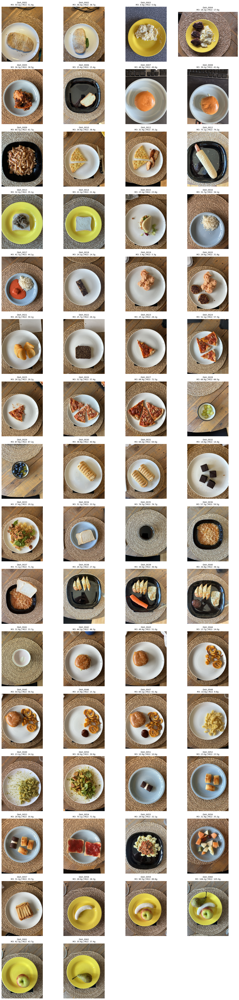

In [ ]:
n = len(clean_model22_df)
cols = 4
rows = int(np.ceil(n / cols))

plt.figure(figsize=(cols * 4, rows * 4))

for i, (_, row) in enumerate(clean_model22_df.iterrows(), start=1):
    img = Image.open(row["rgb_path"]).convert("RGB")

    plt.subplot(rows, cols, i)
    plt.imshow(img)
    plt.axis("off")
    plt.title(
        f"{row['dish_id']}\n"
        f"M3: {row['model3_v3_rgb_pred']:.1f}g | "
        f"M22: {row['model22_predicted_carb_g']:.1f}g",
        fontsize=9
    )

plt.tight_layout()
plt.show()